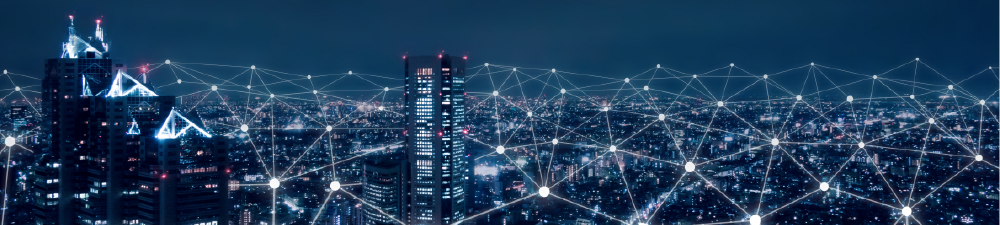

# Mini Project 3  - IU 4.6 Machine Learning

## Packages and setup

In [1]:
import numpy as np
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
import os

from pylab import rcParams

from scipy.stats import shapiro
import scipy.stats as stats

#parameter settings
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
import warnings
warnings.filterwarnings("ignore")
warnings.simplefilter(action='ignore', category=FutureWarning)

## Reading data and initial processing

In [2]:
#edit the file location of raw data set

#import and load dataset
cust_df=pd.read_csv("Mini_project_3_Data.xls")

pd.set_option("max_columns",None)

cust_df.head()

,CustomerID,Churn,MonthlyRevenue,MonthlyMinutes,TotalRecurringCharge,DirectorAssistedCalls,OverageMinutes,RoamingCalls,PercChangeMinutes,PercChangeRevenues,DroppedCalls,BlockedCalls,UnansweredCalls,CustomerCareCalls,ThreewayCalls,ReceivedCalls,OutboundCalls,InboundCalls,PeakCallsInOut,OffPeakCallsInOut,DroppedBlockedCalls,CallForwardingCalls,CallWaitingCalls,MonthsInService,UniqueSubs,ActiveSubs,ServiceArea,Handsets,HandsetModels,CurrentEquipmentDays,AgeHH1,AgeHH2,ChildrenInHH,HandsetRefurbished,HandsetWebCapable,TruckOwner,RVOwner,Homeownership,BuysViaMailOrder,RespondsToMailOffers,OptOutMailings,NonUSTravel,OwnsComputer,HasCreditCard,RetentionCalls,RetentionOffersAccepted,NewCellphoneUser,NotNewCellphoneUser,ReferralsMadeBySubscriber,IncomeGroup,OwnsMotorcycle,AdjustmentsToCreditRating,HandsetPrice,MadeCallToRetentionTeam,CreditRating,PrizmCode,Occupation,MaritalStatus
0,3000002,Yes,24.00,219.0,22.0,0.25,0.0,0.0,-157.0,-19.0,0.7,0.7,6.3,0.0,0.0,97.2,0.0,0.0,58.0,24.0,1.3,0.0,0.3,61,2,1,SEAPOR503,2.0,2.0,361.0,62.0,0.0,No,No,Yes,No,No,Known,Yes,Yes,No,No,Yes,Yes,1,0,No,No,0,4,No,0,30,Yes,1-Highest,Suburban,Professional,No
1,3000010,Yes,16.99,10.0,17.0,0.00,0.0,0.0,-4.0,0.0,0.3,0.0,2.7,0.0,0.0,0.0,0.0,0.0,5.0,1.0,0.3,0.0,0.0,58,1,1,PITHOM412,2.0,1.0,1504.0,40.0,42.0,Yes,No,No,No,No,Known,Yes,Yes,No,No,Yes,Yes,0,0,Yes,No,0,5,No,0,30,No,4-Medium,Suburban,Professional,Yes
2,3000014,No,38.00,8.0,38.0,0.00,0.0,0.0,-2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.4,0.3,0.0,1.3,3.7,0.0,0.0,0.0,60,1,1,MILMIL414,1.0,1.0,1812.0,26.0,26.0,Yes,No,No,No,No,Unknown,No,No,No,No,No,Yes,0,0,Yes,No,0,6,No,0,Unknown,No,3-Good,Town,Crafts,Yes
3,3000022,No,82.28,1312.0,75.0,1.24,0.0,0.0,157.0,8.1,52.0,7.7,76.0,4.3,1.3,200.3,370.3,147.0,555.7,303.7,59.7,0.0,22.7,59,2,2,PITHOM412,9.0,4.0,458.0,30.0,0.0,No,No,Yes,No,No,Known,Yes,Yes,No,No,No,Yes,0,0,Yes,No,0,6,No,0,10,No,4-Medium,Other,Other,No
4,3000026,Yes,17.14,0.0,17.0,0.00,0.0,0.0,0.0,-0.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,53,2,2,OKCTUL918,4.0,3.0,852.0,46.0,54.0,No,No,No,No,No,Known,Yes,Yes,No,No,Yes,Yes,0,0,No,Yes,0,9,No,1,10,No,1-Highest,Other,Professional,Yes


## Exercise

## Identify the dimension of cust_df, check for duplicates for CustomerID, and obtain info regarding column indexes, column ids, non-null counts, data types

In [3]:
# Type your code here to explore and understand the data better

# e.g., identify the dimension of cust_df
print(cust_df.shape)

(51047, 58)


In [4]:
# obtain information and stats for numerical features
cust_df.describe()

,CustomerID,MonthlyRevenue,MonthlyMinutes,TotalRecurringCharge,DirectorAssistedCalls,OverageMinutes,RoamingCalls,PercChangeMinutes,PercChangeRevenues,DroppedCalls,BlockedCalls,UnansweredCalls,CustomerCareCalls,ThreewayCalls,ReceivedCalls,OutboundCalls,InboundCalls,PeakCallsInOut,OffPeakCallsInOut,DroppedBlockedCalls,CallForwardingCalls,CallWaitingCalls,MonthsInService,UniqueSubs,ActiveSubs,Handsets,HandsetModels,CurrentEquipmentDays,AgeHH1,AgeHH2,RetentionCalls,RetentionOffersAccepted,ReferralsMadeBySubscriber,IncomeGroup,AdjustmentsToCreditRating
count,5.104700e+04,50891.000000,50891.000000,50891.000000,50891.000000,50891.000000,50891.000000,50680.000000,50680.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51046.000000,51046.000000,51046.000000,50138.000000,50138.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000
mean,3.201957e+06,58.834492,525.653416,46.830088,0.895229,40.027785,1.236244,-11.547908,-1.191985,6.011489,4.085672,28.288981,1.868999,0.298838,114.800121,25.377715,8.178104,90.549515,67.650790,10.158003,0.012277,1.840504,18.756264,1.532157,1.354340,1.805646,1.558751,380.545841,31.338127,21.144142,0.037201,0.018277,0.052070,4.324524,0.053911
std,1.169056e+05,44.507336,529.871063,23.848871,2.228546,96.588076,9.818294,257.514772,39.574915,9.043955,10.946905,38.876194,5.096138,1.168277,166.485896,35.209147,16.665878,104.947470,92.752699,15.555284,0.594168,5.585129,9.800138,1.223384,0.675477,1.331173,0.905932,253.801982,22.094635,23.931368,0.206483,0.142458,0.307592,3.138236,0.383147
min,3.000002e+06,-6.170000,0.000000,-11.000000,0.000000,0.000000,0.000000,-3875.000000,-1107.700000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,1.000000,0.000000,1.000000,1.000000,-5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.100632e+06,33.610000,158.000000,30.000000,0.000000,0.000000,0.000000,-83.000000,-7.100000,0.700000,0.000000,5.300000,0.000000,0.000000,8.300000,3.300000,0.000000,23.000000,11.000000,1.700000,0.000000,0.000000,11.000000,1.000000,1.000000,1.000000,1.000000,205.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,3.201534e+06,48.460000,366.000000,45.000000,0.250000,3.000000,0.000000,-5.000000,-0.300000,3.000000,1.000000,16.300000,0.000000,0.000000,52.800000,13.700000,2.000000,62.000000,35.700000,5.300000,0.000000,0.300000,16.000000,1.000000,1.000000,1.000000,1.000000,329.000000,36.000000,0.000000,0.000000,0.000000,0.000000,5.000000,0.000000
75%,3.305376e+06,71.065000,723.000000,60.000000,0.990000,41.000000,0.300000,66.000000,1.600000,7.700000,3.700000,36.300000,1.700000,0.300000,153.500000,34.000000,9.300000,121.300000,88.700000,12.300000,0.000000,1.300000,24.000000,2.000000,2.000000,2.000000,2.000000,515.000000,48.000000,42.000000,0.000000,0.000000,0.000000,7.000000,0.000000
max,3.399994e+06,1223.380000,7359.000000,400.000000,159.390000,4321.000000,1112.400000,5192.000000,2483.500000,221.700000,384.300000,848.700000,327.300000,66.000000,2692.400000,644.300000,519.300000,2090.700000,1474.700000,411.700000,81.300000,212.700000,61.000000,196.000000,53.000000,24.000000,15.000000,1812.000000,99.000000,99.000000,4.000000,3.000000,35.000000,9.000000,25.000000


The data set contains 51047 cases and 58 columns. 

In [5]:
# check for duplicate CustomerIDs

print(cust_df.CustomerID.unique().shape)

(51047,)


No duplicates found for CustomerID.

In [6]:
# get info of dataframe - column ids, non-null counts, data types
cust_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51047 entries, 0 to 51046
Data columns (total 58 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   CustomerID                 51047 non-null  int64  
 1   Churn                      51047 non-null  object 
 2   MonthlyRevenue             50891 non-null  float64
 3   MonthlyMinutes             50891 non-null  float64
 4   TotalRecurringCharge       50891 non-null  float64
 5   DirectorAssistedCalls      50891 non-null  float64
 6   OverageMinutes             50891 non-null  float64
 7   RoamingCalls               50891 non-null  float64
 8   PercChangeMinutes          50680 non-null  float64
 9   PercChangeRevenues         50680 non-null  float64
 10  DroppedCalls               51047 non-null  float64
 11  BlockedCalls               51047 non-null  float64
 12  UnansweredCalls            51047 non-null  float64
 13  CustomerCareCalls          51047 non-null  flo

In [7]:
# see how many values are null in each column field
cust_df.isnull().sum()

CustomerID                     0
Churn                          0
MonthlyRevenue               156
MonthlyMinutes               156
TotalRecurringCharge         156
DirectorAssistedCalls        156
OverageMinutes               156
RoamingCalls                 156
PercChangeMinutes            367
PercChangeRevenues           367
DroppedCalls                   0
BlockedCalls                   0
UnansweredCalls                0
CustomerCareCalls              0
ThreewayCalls                  0
ReceivedCalls                  0
OutboundCalls                  0
InboundCalls                   0
PeakCallsInOut                 0
OffPeakCallsInOut              0
DroppedBlockedCalls            0
CallForwardingCalls            0
CallWaitingCalls               0
MonthsInService                0
UniqueSubs                     0
ActiveSubs                     0
ServiceArea                   24
Handsets                       1
HandsetModels                  1
CurrentEquipmentDays           1
AgeHH1    

## Q1. Detect and resolve problems in the data (Missing value, Outliers, Unexpected value, etc.)

### Q1.1 How many customers had zero monthly revenue?

In [8]:
#How many customers had zero monthly revenue?

#count total values in "MonthlyRevenue" column that are nan or 0
cust_df[cust_df.MonthlyRevenue==0].shape[0]

6

6 customers had zero monthly revenue. 

In [9]:
#Exclude the customers with zero monthly revenue from cust_df and from any subsequent analysis

cust_df=cust_df[cust_df.MonthlyRevenue>0.0]
print(cust_df.shape)

(50882, 58)


The data set now contains 50882 cases and 58 columns. 165 rows excluded by only including rows with values that are greater than zero in the "MonthlyRevenue" column field. We excluded the 6 zero values and 159 missing / unknown values.

### Q1.2 How many columns have missing values percentage > 5%

In [10]:
# Look for columns with 'Unknown' values
print((cust_df.astype(np.object) == 'Unknown').any())

CustomerID                   False
Churn                        False
MonthlyRevenue               False
MonthlyMinutes               False
TotalRecurringCharge         False
DirectorAssistedCalls        False
OverageMinutes               False
RoamingCalls                 False
PercChangeMinutes            False
PercChangeRevenues           False
DroppedCalls                 False
BlockedCalls                 False
UnansweredCalls              False
CustomerCareCalls            False
ThreewayCalls                False
ReceivedCalls                False
OutboundCalls                False
InboundCalls                 False
PeakCallsInOut               False
OffPeakCallsInOut            False
DroppedBlockedCalls          False
CallForwardingCalls          False
CallWaitingCalls             False
MonthsInService              False
UniqueSubs                   False
ActiveSubs                   False
ServiceArea                  False
Handsets                     False
HandsetModels       

In [11]:
# Replace all 'Unknown' values with nan
cols = ["Homeownership", "HandsetPrice", 'MaritalStatus']
for column in cols:
    cust_df.loc[cust_df[column] == 'Unknown', column] = np.nan

In [12]:
# Calculate for each column % of missing value in the data
cust_df_nan=(cust_df.isnull().sum()/cust_df.shape[0])*100

# Display percentage of missing values (%)
cust_df_nan.sort_values(inplace=True, ascending=False)
cust_df_nan=pd.DataFrame(cust_df_nan).rename(columns={0: "percentage_of_missing_values"})
cust_df_nan

,percentage_of_missing_values
HandsetPrice,56.825596
MaritalStatus,38.595181
Homeownership,33.428324
AgeHH1,1.778625
AgeHH2,1.778625
PercChangeMinutes,0.408789
PercChangeRevenues,0.408789
ServiceArea,0.047168
Handsets,0.001965
CurrentEquipmentDays,0.001965


In [13]:
# Display Columns with missing values (percentage > 0%)
display(cust_df_nan[cust_df_nan["percentage_of_missing_values"]>0])

,percentage_of_missing_values
HandsetPrice,56.825596
MaritalStatus,38.595181
Homeownership,33.428324
AgeHH1,1.778625
AgeHH2,1.778625
PercChangeMinutes,0.408789
PercChangeRevenues,0.408789
ServiceArea,0.047168
Handsets,0.001965
CurrentEquipmentDays,0.001965


In [14]:
# How many columns has missing values percentage > 5% ?

# Display Columns with missing values percentage > 5%
display(cust_df_nan[cust_df_nan["percentage_of_missing_values"]>5])

# Count of columns with missing values percentage > 5%
cust_df_nan[cust_df_nan["percentage_of_missing_values"]>5].count()

,percentage_of_missing_values
HandsetPrice,56.825596
MaritalStatus,38.595181
Homeownership,33.428324


percentage_of_missing_values    3
dtype: int64

3 columns (HandsetPrice, MaritalStatus, Homeownership) have missing values percentage > 5%.  

8 columns (AgeHH1, AgeHH2, PercChangeMinutes, PercChangeRevenues, ServiceArea, Handsets, CurrentEquipmentDays, HandsetModels) have missing values percentage < 5%.

In [15]:
#What strategy should be used for imputation?

cust_df.drop(["HandsetPrice", "MaritalStatus", "Homeownership"], axis = 1,inplace=True) 
cust_df.shape

(50882, 55)

The 3 columns with a substantial percentage of missing values (>30%) have been dropped from the data frame.

In [16]:
# Dropping all the rows with nan values
cust_df.dropna(inplace=True)

cust_df.shape

print((50882-cust_df.shape[0])*100/50882)

(49746, 55)

2.2326166424275775


The remaining 1,136 rows with missing values (in the 8 columns with missing values <5%) have been dropped from the data frame.  
The dropped rows consist of approx. 2.23% of total rows.

In [17]:
cust_df.shape

(49746, 55)

In [18]:
cust_df.describe()

,CustomerID,MonthlyRevenue,MonthlyMinutes,TotalRecurringCharge,DirectorAssistedCalls,OverageMinutes,RoamingCalls,PercChangeMinutes,PercChangeRevenues,DroppedCalls,BlockedCalls,UnansweredCalls,CustomerCareCalls,ThreewayCalls,ReceivedCalls,OutboundCalls,InboundCalls,PeakCallsInOut,OffPeakCallsInOut,DroppedBlockedCalls,CallForwardingCalls,CallWaitingCalls,MonthsInService,UniqueSubs,ActiveSubs,Handsets,HandsetModels,CurrentEquipmentDays,AgeHH1,AgeHH2,RetentionCalls,RetentionOffersAccepted,ReferralsMadeBySubscriber,IncomeGroup,AdjustmentsToCreditRating
count,4.974600e+04,49746.000000,49746.000000,49746.000000,49746.000000,49746.000000,49746.000000,49746.000000,49746.000000,49746.000000,49746.000000,49746.000000,49746.000000,49746.000000,49746.000000,49746.000000,49746.000000,49746.000000,49746.000000,49746.000000,49746.000000,49746.000000,49746.000000,49746.000000,49746.000000,49746.00000,49746.000000,49746.000000,49746.000000,49746.000000,49746.000000,49746.000000,49746.000000,49746.000000,49746.000000
mean,3.200938e+06,58.724698,525.083223,46.840228,0.891948,39.758835,1.226474,-11.657581,-1.176322,6.011167,4.078286,28.294108,1.874243,0.298458,114.722824,25.353259,8.164650,90.460735,67.719198,10.150267,0.011774,1.837450,18.729506,1.528987,1.350822,1.80517,1.558758,379.978591,31.339022,21.148454,0.035500,0.018333,0.051482,4.402706,0.053673
std,1.164621e+05,44.314887,528.512019,23.755703,2.224838,96.096409,9.848945,255.873590,39.394472,9.036997,10.837036,38.861677,5.111556,1.171150,166.112573,35.025225,16.587614,104.602954,92.738896,15.456620,0.582437,5.590815,9.736624,1.225887,0.667820,1.33089,0.906291,252.217719,22.091837,23.926885,0.201976,0.142862,0.266506,3.110604,0.382676
min,3.000002e+06,0.520000,0.000000,-6.000000,0.000000,0.000000,0.000000,-3875.000000,-1107.700000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,1.000000,0.000000,1.00000,1.000000,-5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.100079e+06,33.620000,158.000000,30.000000,0.000000,0.000000,0.000000,-83.000000,-7.000000,0.700000,0.000000,5.300000,0.000000,0.000000,8.500000,3.300000,0.000000,23.300000,11.000000,2.000000,0.000000,0.000000,11.000000,1.000000,1.000000,1.00000,1.000000,205.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
50%,3.200126e+06,48.380000,366.000000,45.000000,0.250000,3.000000,0.000000,-5.000000,-0.300000,3.000000,1.000000,16.300000,0.000000,0.000000,52.900000,13.700000,2.000000,62.000000,35.700000,5.300000,0.000000,0.300000,16.000000,1.000000,1.000000,1.00000,1.000000,330.000000,36.000000,0.000000,0.000000,0.000000,0.000000,5.000000,0.000000
75%,3.303617e+06,70.910000,722.000000,60.000000,0.990000,40.000000,0.300000,65.000000,1.600000,7.700000,3.700000,36.300000,1.700000,0.300000,153.400000,34.000000,9.300000,121.000000,88.700000,12.300000,0.000000,1.300000,24.000000,2.000000,2.000000,2.00000,2.000000,515.000000,48.000000,42.000000,0.000000,0.000000,0.000000,7.000000,0.000000
max,3.399974e+06,1223.380000,7359.000000,400.000000,159.390000,4321.000000,1112.400000,5192.000000,2483.500000,221.700000,324.700000,848.700000,327.300000,66.000000,2692.400000,644.300000,519.300000,2090.700000,1474.700000,339.000000,81.300000,212.700000,61.000000,196.000000,53.000000,24.00000,15.000000,1812.000000,99.000000,99.000000,4.000000,3.000000,16.000000,9.000000,25.000000


<mark>__Result:__ Type your answer here for how would you impute the missing values (if any)  

    
We suggest to drop the 3 columns "HandsetPrice", "MaritalStatus", "Homeownership" from the dataframe, as the percentage of missing values are high at 56.83%, 38.60% and 33.43% respectively which are quite high and are unlikely to be useful for our analysis.  
    
Furthermore, marital status or home ownership or handset prices cannot be reasonably computed or estimated from other known values in those columns as they are independent, unique customers and there is not enough information.


For the remaining 8 columns with missing values (AgeHH1, AgeHH2, PercChangeMinutes, PercChangeRevenues, ServiceArea, Handsets, CurrentEquipmentDays, HandsetModels), as the respective columns each have less than 2% missing values, we suggest to drop the rows with NaN values, probably inconsequential to drop them.

### Q1.3 For columns, "UniqueSubs" and "DirectorAssistedCalls" remove outliers, if any

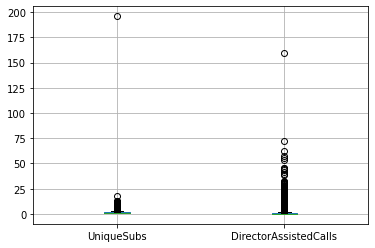

In [19]:
#plot box plot using pandas for columns "UniqueSubs" and "DirectorAssistedCalls"
cols=["UniqueSubs","DirectorAssistedCalls"]
cust_df.boxplot(column=cols);

In [20]:
#Remove top 1% outliers from the above mentioned two columns and plot the box plot again
#Use "quantile" function to identify top 1% outliers

print(cust_df['UniqueSubs'].quantile([0.99]))
print(cust_df['DirectorAssistedCalls'].quantile([0.99]))

0.99    5.0
Name: UniqueSubs, dtype: float64
0.99    9.65
Name: DirectorAssistedCalls, dtype: float64


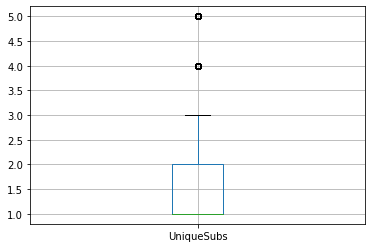

In [21]:
cust_df[cust_df["UniqueSubs"]<=5.0].boxplot(column="UniqueSubs");

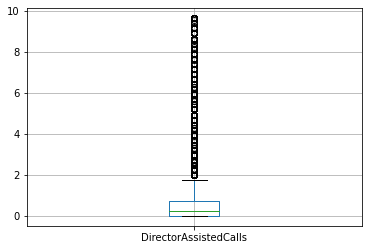

In [22]:
cust_df[cust_df["DirectorAssistedCalls"]<=9.65].boxplot(column="DirectorAssistedCalls");

## Q2. Perform exploratory analysis to analyze customer churn

### Q2.1 Does customers with high overage minutes also have high revenue?

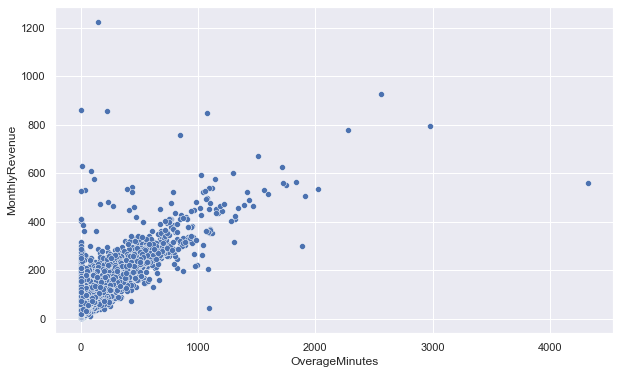

In [23]:
s

<mark>__Result:__
    
Most of the Overage Minutes fall between 0-1000. 
There appears to be a positive linear relationship between Overage Minutes and Monthly Revenue.  
Very few customers exceed 2000 Overage Minutes and when they do, the monthly revenues are also higher than average, usually above 500 a month.  
    
Customers with high overage minutes also have high revenue, but there are very few of these customers.

### Q2.2 Does high number of active subscribers lead to low monthly revenue?

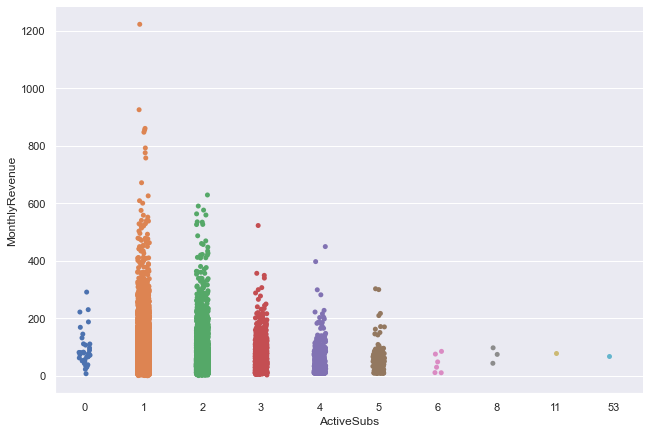

In [24]:
#use category plot to plot monthly revenue for each active subs category
sns.catplot(x = 'ActiveSubs', y = 'MonthlyRevenue', data = cust_df, height=6, aspect=1.5);

<mark>__Result:__
    
Based on the categorical scatterplot above, higher number of active subscribers (greater than 1) or zero active subscribers will lead to lower monthly revenues. The highest monthly revenues tends to be when the number of active subscribers is 1. 

### Q2.3 Does credit rating have an impact in churn rate?

In [25]:
cust_df["Churn"].value_counts()

No     35501
Yes    14245
Name: Churn, dtype: int64

14245 customers churned and 35501 customers did not churn.  

In [26]:
print(cust_df[cust_df["Churn"]=='Yes']["Churn"].count()*100/cust_df["Churn"].count())

28.635468178346


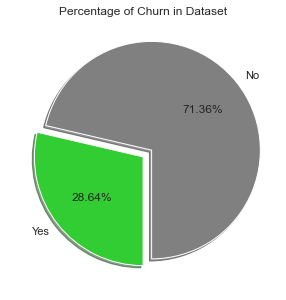

In [27]:
sizes = cust_df['Churn'].value_counts(sort = True)
colors = ["grey","limegreen"] 
explode = (0.1, 0)
labels='No', 'Yes' 
rcParams['figure.figsize'] = 5,5
# Plot
plt.pie(sizes, explode=explode , labels=labels, colors=colors,
        autopct='%1.2f%%', shadow=True, startangle=270,)
plt.title('Percentage of Churn in Dataset')
plt.show();

We note that only 28.64% of total customers churned.

In [28]:
churn_counts = cust_df[['CustomerID','Churn', 'CreditRating']].groupby(['CreditRating','Churn']).agg('count').rename(columns={'CustomerID':'CustomerCount'})

# calculate the churn rates (%) by credit rating categories & create new column for it
churn_counts['ChurnRate']=churn_counts.groupby('CreditRating')['CustomerCount'].apply(lambda x:((x*100/x.sum())).round(4))

# flatten hierarchical indexes for simplicity
churn_counts.columns = churn_counts.columns.values
churn_counts=churn_counts.reset_index()
churn_counts

,CreditRating,Churn,CustomerCount,ChurnRate
0,1-Highest,No,5795,69.2685
1,1-Highest,Yes,2571,30.7315
2,2-High,No,13081,69.9856
3,2-High,Yes,5610,30.0144
4,3-Good,No,5693,69.2579
5,3-Good,Yes,2527,30.7421
6,4-Medium,No,3883,74.2874
7,4-Medium,Yes,1344,25.7126
8,5-Low,No,4947,78.2877
9,5-Low,Yes,1372,21.7123


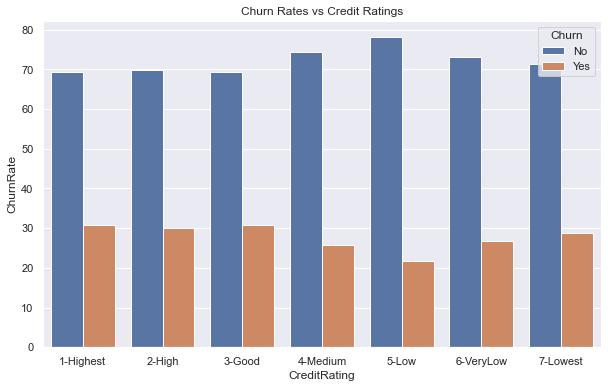

In [29]:
sns.set(rc={"figure.figsize":(10, 6)}) 
sns.barplot(x="CreditRating", y="ChurnRate",hue="Churn",data=churn_counts).set_title('Churn Rates vs Credit Ratings');

In [30]:
# obtain churn rates (%) by credit rating categories, filter for Churn == 'Yes'
churn_counts=churn_counts[churn_counts['Churn']=='Yes']
churn_counts

,CreditRating,Churn,CustomerCount,ChurnRate
1,1-Highest,Yes,2571,30.7315
3,2-High,Yes,5610,30.0144
5,3-Good,Yes,2527,30.7421
7,4-Medium,Yes,1344,25.7126
9,5-Low,Yes,1372,21.7123
11,6-VeryLow,Yes,234,26.7429
13,7-Lowest,Yes,587,28.6621


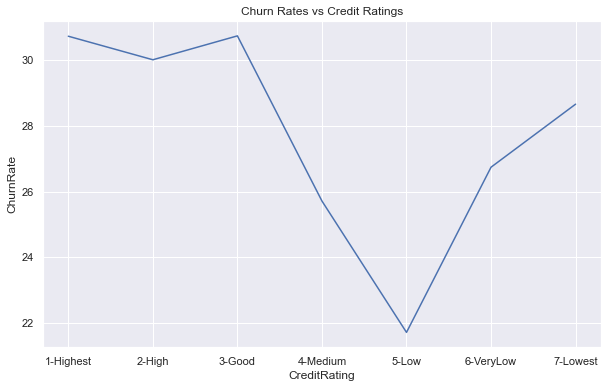

In [31]:
sns.lineplot(x="CreditRating", y="ChurnRate",data=churn_counts).set_title('Churn Rates vs Credit Ratings');

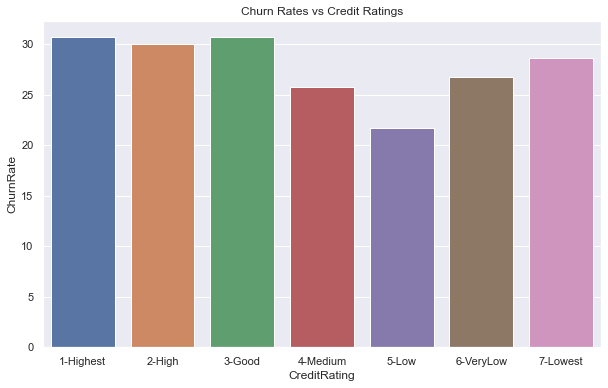

In [32]:
sns.barplot(x="CreditRating", y="ChurnRate",data=churn_counts).set_title('Churn Rates vs Credit Ratings');

<mark>__Result:__
    
The customers with the highest churn rates tend to be those customers with Highest to Good credit ratings (1 to 3), which all 3 categories have above 30% churn rates. 

Lower churn rates are seen for customers with Medium and Low credit ratings (4 to 5), with the lowest churn rates at 21.71% for customers with Low credit ratings (5).

For customers with the worst credit ratings of VeryLow and Lowest credit ratings (6 to 7), they tend to have higher churn rates of above 26%, but below 30%.
    
There is no clear impact or correlation of credit rating on churn rate.

### Placeholder for additional exploratory analysis

In [33]:
#type your code here for any additional exploratory analysis (if any)

## Q3. Create additional features to help predict churn

In [34]:
#wrapper function to create additional features for churn prediction
def create_features(cust_df):
    
    #3.1 Percent of current active subs over total subs
    cust_df['perc_active_subs'] = 100*cust_df['ActiveSubs'] / cust_df['UniqueSubs'].sum()
    
    #3.2 Percent of recurrent charge to monthly charge
    cust_df['perc_recurrent_charge'] = 100*cust_df['TotalRecurringCharge']/cust_df["MonthlyRevenue"]
    
    #3.3 Percent of overage minutes over total monthly minutes
    cust_df['perc_overage_minutes'] = 100*cust_df['OverageMinutes']/(cust_df['MonthlyMinutes'].sum()+cust_df['OverageMinutes'].sum())
    
    return cust_df  

In [35]:
#Make a call to the feature engineering wrapper function for churn prediction
cust_df=create_features(cust_df)

cust_df.head()

,CustomerID,Churn,MonthlyRevenue,MonthlyMinutes,TotalRecurringCharge,DirectorAssistedCalls,OverageMinutes,RoamingCalls,PercChangeMinutes,PercChangeRevenues,DroppedCalls,BlockedCalls,UnansweredCalls,CustomerCareCalls,ThreewayCalls,ReceivedCalls,OutboundCalls,InboundCalls,PeakCallsInOut,OffPeakCallsInOut,DroppedBlockedCalls,CallForwardingCalls,CallWaitingCalls,MonthsInService,UniqueSubs,ActiveSubs,ServiceArea,Handsets,HandsetModels,CurrentEquipmentDays,AgeHH1,AgeHH2,ChildrenInHH,HandsetRefurbished,HandsetWebCapable,TruckOwner,RVOwner,BuysViaMailOrder,RespondsToMailOffers,OptOutMailings,NonUSTravel,OwnsComputer,HasCreditCard,RetentionCalls,RetentionOffersAccepted,NewCellphoneUser,NotNewCellphoneUser,ReferralsMadeBySubscriber,IncomeGroup,OwnsMotorcycle,AdjustmentsToCreditRating,MadeCallToRetentionTeam,CreditRating,PrizmCode,Occupation,perc_active_subs,perc_recurrent_charge,perc_overage_minutes
0,3000002,Yes,24.00,219.0,22.0,0.25,0.0,0.0,-157.0,-19.0,0.7,0.7,6.3,0.0,0.0,97.2,0.0,0.0,58.0,24.0,1.3,0.0,0.3,61,2,1,SEAPOR503,2.0,2.0,361.0,62.0,0.0,No,No,Yes,No,No,Yes,Yes,No,No,Yes,Yes,1,0,No,No,0,4,No,0,Yes,1-Highest,Suburban,Professional,0.001315,91.666667,0.0
1,3000010,Yes,16.99,10.0,17.0,0.00,0.0,0.0,-4.0,0.0,0.3,0.0,2.7,0.0,0.0,0.0,0.0,0.0,5.0,1.0,0.3,0.0,0.0,58,1,1,PITHOM412,2.0,1.0,1504.0,40.0,42.0,Yes,No,No,No,No,Yes,Yes,No,No,Yes,Yes,0,0,Yes,No,0,5,No,0,No,4-Medium,Suburban,Professional,0.001315,100.058858,0.0
2,3000014,No,38.00,8.0,38.0,0.00,0.0,0.0,-2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.4,0.3,0.0,1.3,3.7,0.0,0.0,0.0,60,1,1,MILMIL414,1.0,1.0,1812.0,26.0,26.0,Yes,No,No,No,No,No,No,No,No,No,Yes,0,0,Yes,No,0,6,No,0,No,3-Good,Town,Crafts,0.001315,100.000000,0.0
3,3000022,No,82.28,1312.0,75.0,1.24,0.0,0.0,157.0,8.1,52.0,7.7,76.0,4.3,1.3,200.3,370.3,147.0,555.7,303.7,59.7,0.0,22.7,59,2,2,PITHOM412,9.0,4.0,458.0,30.0,0.0,No,No,Yes,No,No,Yes,Yes,No,No,No,Yes,0,0,Yes,No,0,6,No,0,No,4-Medium,Other,Other,0.002629,91.152163,0.0
4,3000026,Yes,17.14,0.0,17.0,0.00,0.0,0.0,0.0,-0.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,53,2,2,OKCTUL918,4.0,3.0,852.0,46.0,54.0,No,No,No,No,No,Yes,Yes,No,No,Yes,Yes,0,0,No,Yes,0,9,No,1,No,1-Highest,Other,Professional,0.002629,99.183197,0.0


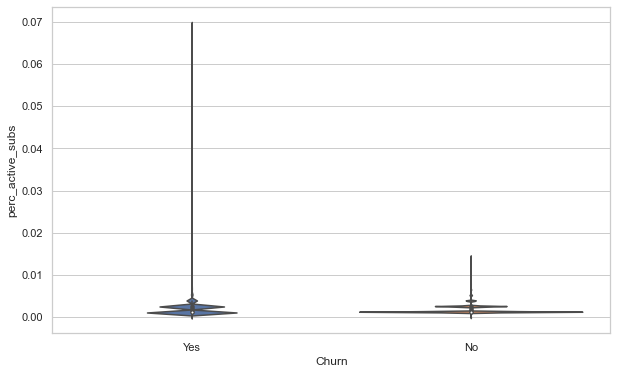

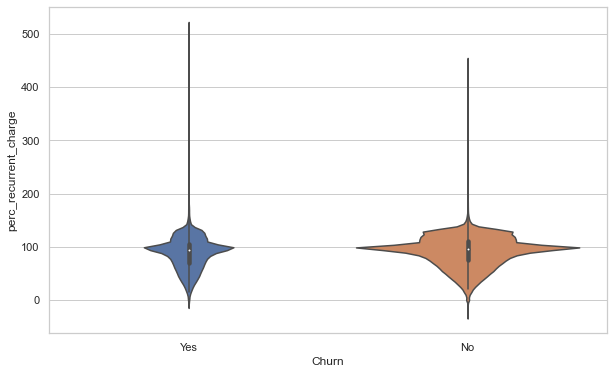

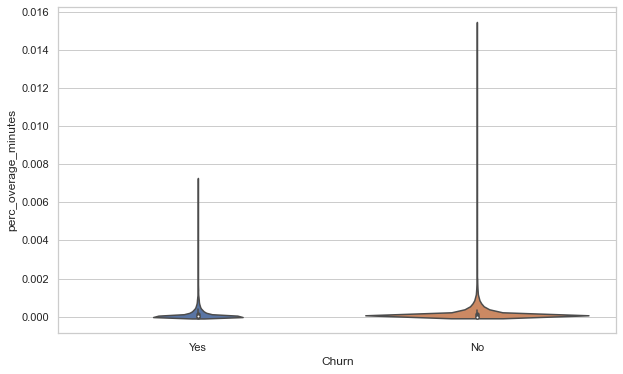

In [36]:
def plot_violin(cust_df, cols, col_x = 'Churn'):
    for col in cols:
        sns.set_style("whitegrid")
        # add argument x=col_x, y=col
        sns.violinplot(x=col_x, y=col, data=cust_df, scale = 'count')
        plt.xlabel(col_x) # Set text for the x axis
        plt.ylabel(col)# Set text for y axis
        plt.show()

cat_cols=['perc_active_subs','perc_recurrent_charge','perc_overage_minutes']
plot_violin(cust_df, cat_cols) 

---

## Q4. Build classification model to predict customer churn month in advance

### Initial data processing for model building exercise

In [37]:
# Replace Churn values with 0 and 1
cust_df['Churn'].replace({"Yes":1, "No":0},inplace=True)

In [38]:
cust_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 49746 entries, 0 to 51043
Data columns (total 58 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   CustomerID                 49746 non-null  int64  
 1   Churn                      49746 non-null  int64  
 2   MonthlyRevenue             49746 non-null  float64
 3   MonthlyMinutes             49746 non-null  float64
 4   TotalRecurringCharge       49746 non-null  float64
 5   DirectorAssistedCalls      49746 non-null  float64
 6   OverageMinutes             49746 non-null  float64
 7   RoamingCalls               49746 non-null  float64
 8   PercChangeMinutes          49746 non-null  float64
 9   PercChangeRevenues         49746 non-null  float64
 10  DroppedCalls               49746 non-null  float64
 11  BlockedCalls               49746 non-null  float64
 12  UnansweredCalls            49746 non-null  float64
 13  CustomerCareCalls          49746 non-null  flo

There are 19 categorical variables.

In [39]:
cust_df.select_dtypes(include=object).columns

Index(['ServiceArea', 'ChildrenInHH', 'HandsetRefurbished',
       'HandsetWebCapable', 'TruckOwner', 'RVOwner', 'BuysViaMailOrder',
       'RespondsToMailOffers', 'OptOutMailings', 'NonUSTravel', 'OwnsComputer',
       'HasCreditCard', 'NewCellphoneUser', 'NotNewCellphoneUser',
       'OwnsMotorcycle', 'MadeCallToRetentionTeam', 'CreditRating',
       'PrizmCode', 'Occupation'],
      dtype='object')

In [40]:
# Count of unique values in categorical variables
cust_df[['ServiceArea', 'ChildrenInHH', 'HandsetRefurbished',
       'HandsetWebCapable', 'TruckOwner', 'RVOwner', 'BuysViaMailOrder',
       'RespondsToMailOffers', 'OptOutMailings', 'NonUSTravel', 'OwnsComputer',
       'HasCreditCard', 'NewCellphoneUser', 'NotNewCellphoneUser',
       'OwnsMotorcycle', 'MadeCallToRetentionTeam', 'CreditRating',
       'PrizmCode', 'Occupation']].nunique()

ServiceArea                743
ChildrenInHH                 2
HandsetRefurbished           2
HandsetWebCapable            2
TruckOwner                   2
RVOwner                      2
BuysViaMailOrder             2
RespondsToMailOffers         2
OptOutMailings               2
NonUSTravel                  2
OwnsComputer                 2
HasCreditCard                2
NewCellphoneUser             2
NotNewCellphoneUser          2
OwnsMotorcycle               2
MadeCallToRetentionTeam      2
CreditRating                 7
PrizmCode                    4
Occupation                   8
dtype: int64

In [41]:
#Train - test split to train and test model accuracy
from sklearn.model_selection import train_test_split

#Create dummy variables for 18 categorical variables 
# Excluded ServiceArea due to too many unique values and not very relevant in predicting Churn

dummy_df = pd.get_dummies(cust_df[['ChildrenInHH', 'HandsetRefurbished',
       'HandsetWebCapable', 'TruckOwner', 'RVOwner', 'BuysViaMailOrder',
       'RespondsToMailOffers', 'OptOutMailings', 'NonUSTravel', 'OwnsComputer',
       'HasCreditCard', 'NewCellphoneUser', 'NotNewCellphoneUser',
       'OwnsMotorcycle', 'MadeCallToRetentionTeam', 'CreditRating',
       'PrizmCode', 'Occupation']])
print(dummy_df.shape)

# DataFrame with numerical variables only
cust_df_num=cust_df.drop(['ServiceArea', 'ChildrenInHH', 'HandsetRefurbished',
       'HandsetWebCapable', 'TruckOwner', 'RVOwner', 'BuysViaMailOrder',
       'RespondsToMailOffers', 'OptOutMailings', 'NonUSTravel', 'OwnsComputer',
       'HasCreditCard', 'NewCellphoneUser', 'NotNewCellphoneUser',
       'OwnsMotorcycle', 'MadeCallToRetentionTeam', 'CreditRating',
       'PrizmCode', 'Occupation'], axis = 1) 
print(cust_df_num.shape)

# Concatenate numeric variables with dummy variables into a single dataframe
cust_df = pd.concat([cust_df_num, dummy_df],axis=1)
print(cust_df.shape)
display(cust_df.head())

(49746, 49)
(49746, 39)
(49746, 88)


,CustomerID,Churn,MonthlyRevenue,MonthlyMinutes,TotalRecurringCharge,DirectorAssistedCalls,OverageMinutes,RoamingCalls,PercChangeMinutes,PercChangeRevenues,DroppedCalls,BlockedCalls,UnansweredCalls,CustomerCareCalls,ThreewayCalls,ReceivedCalls,OutboundCalls,InboundCalls,PeakCallsInOut,OffPeakCallsInOut,DroppedBlockedCalls,CallForwardingCalls,CallWaitingCalls,MonthsInService,UniqueSubs,ActiveSubs,Handsets,HandsetModels,CurrentEquipmentDays,AgeHH1,AgeHH2,RetentionCalls,RetentionOffersAccepted,ReferralsMadeBySubscriber,IncomeGroup,AdjustmentsToCreditRating,perc_active_subs,perc_recurrent_charge,perc_overage_minutes,ChildrenInHH_No,ChildrenInHH_Yes,HandsetRefurbished_No,HandsetRefurbished_Yes,HandsetWebCapable_No,HandsetWebCapable_Yes,TruckOwner_No,TruckOwner_Yes,RVOwner_No,RVOwner_Yes,BuysViaMailOrder_No,BuysViaMailOrder_Yes,RespondsToMailOffers_No,RespondsToMailOffers_Yes,OptOutMailings_No,OptOutMailings_Yes,NonUSTravel_No,NonUSTravel_Yes,OwnsComputer_No,OwnsComputer_Yes,HasCreditCard_No,HasCreditCard_Yes,NewCellphoneUser_No,NewCellphoneUser_Yes,NotNewCellphoneUser_No,NotNewCellphoneUser_Yes,OwnsMotorcycle_No,OwnsMotorcycle_Yes,MadeCallToRetentionTeam_No,MadeCallToRetentionTeam_Yes,CreditRating_1-Highest,CreditRating_2-High,CreditRating_3-Good,CreditRating_4-Medium,CreditRating_5-Low,CreditRating_6-VeryLow,CreditRating_7-Lowest,PrizmCode_Other,PrizmCode_Rural,PrizmCode_Suburban,PrizmCode_Town,Occupation_Clerical,Occupation_Crafts,Occupation_Homemaker,Occupation_Other,Occupation_Professional,Occupation_Retired,Occupation_Self,Occupation_Student
0,3000002,1,24.00,219.0,22.0,0.25,0.0,0.0,-157.0,-19.0,0.7,0.7,6.3,0.0,0.0,97.2,0.0,0.0,58.0,24.0,1.3,0.0,0.3,61,2,1,2.0,2.0,361.0,62.0,0.0,1,0,0,4,0,0.001315,91.666667,0.0,1,0,1,0,0,1,1,0,1,0,0,1,0,1,1,0,1,0,0,1,0,1,1,0,1,0,1,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0
1,3000010,1,16.99,10.0,17.0,0.00,0.0,0.0,-4.0,0.0,0.3,0.0,2.7,0.0,0.0,0.0,0.0,0.0,5.0,1.0,0.3,0.0,0.0,58,1,1,2.0,1.0,1504.0,40.0,42.0,0,0,0,5,0,0.001315,100.058858,0.0,0,1,1,0,1,0,1,0,1,0,0,1,0,1,1,0,1,0,0,1,0,1,0,1,1,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0
2,3000014,0,38.00,8.0,38.0,0.00,0.0,0.0,-2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.4,0.3,0.0,1.3,3.7,0.0,0.0,0.0,60,1,1,1.0,1.0,1812.0,26.0,26.0,0,0,0,6,0,0.001315,100.000000,0.0,0,1,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,0,1,0,1,1,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0
3,3000022,0,82.28,1312.0,75.0,1.24,0.0,0.0,157.0,8.1,52.0,7.7,76.0,4.3,1.3,200.3,370.3,147.0,555.7,303.7,59.7,0.0,22.7,59,2,2,9.0,4.0,458.0,30.0,0.0,0,0,0,6,0,0.002629,91.152163,0.0,1,0,1,0,0,1,1,0,1,0,0,1,0,1,1,0,1,0,1,0,0,1,0,1,1,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0
4,3000026,1,17.14,0.0,17.0,0.00,0.0,0.0,0.0,-0.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,53,2,2,4.0,3.0,852.0,46.0,54.0,0,0,0,9,1,0.002629,99.183197,0.0,1,0,1,0,1,0,1,0,1,0,0,1,0,1,1,0,1,0,0,1,0,1,1,0,0,1,1,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0


With the dummy variables the original 18 categorical features are now 49 dummy variables. With the 37 numeric features, the 1 numeric identifier column (CustomerID) and the 1 numeric label column (Churn), there are a total of 88 variables.

In [42]:
#Define columns to be included in X and y
# X = Independent variables
# Y = Dependent variable (churn flag)

# features
# all rows, columns from column at index 2 onwards
X = cust_df.iloc[:,2:]  

# label
# all rows, column at index 1 only
y = cust_df.iloc[:,1] 

display(X.head())
display(y)

,MonthlyRevenue,MonthlyMinutes,TotalRecurringCharge,DirectorAssistedCalls,OverageMinutes,RoamingCalls,PercChangeMinutes,PercChangeRevenues,DroppedCalls,BlockedCalls,UnansweredCalls,CustomerCareCalls,ThreewayCalls,ReceivedCalls,OutboundCalls,InboundCalls,PeakCallsInOut,OffPeakCallsInOut,DroppedBlockedCalls,CallForwardingCalls,CallWaitingCalls,MonthsInService,UniqueSubs,ActiveSubs,Handsets,HandsetModels,CurrentEquipmentDays,AgeHH1,AgeHH2,RetentionCalls,RetentionOffersAccepted,ReferralsMadeBySubscriber,IncomeGroup,AdjustmentsToCreditRating,perc_active_subs,perc_recurrent_charge,perc_overage_minutes,ChildrenInHH_No,ChildrenInHH_Yes,HandsetRefurbished_No,HandsetRefurbished_Yes,HandsetWebCapable_No,HandsetWebCapable_Yes,TruckOwner_No,TruckOwner_Yes,RVOwner_No,RVOwner_Yes,BuysViaMailOrder_No,BuysViaMailOrder_Yes,RespondsToMailOffers_No,RespondsToMailOffers_Yes,OptOutMailings_No,OptOutMailings_Yes,NonUSTravel_No,NonUSTravel_Yes,OwnsComputer_No,OwnsComputer_Yes,HasCreditCard_No,HasCreditCard_Yes,NewCellphoneUser_No,NewCellphoneUser_Yes,NotNewCellphoneUser_No,NotNewCellphoneUser_Yes,OwnsMotorcycle_No,OwnsMotorcycle_Yes,MadeCallToRetentionTeam_No,MadeCallToRetentionTeam_Yes,CreditRating_1-Highest,CreditRating_2-High,CreditRating_3-Good,CreditRating_4-Medium,CreditRating_5-Low,CreditRating_6-VeryLow,CreditRating_7-Lowest,PrizmCode_Other,PrizmCode_Rural,PrizmCode_Suburban,PrizmCode_Town,Occupation_Clerical,Occupation_Crafts,Occupation_Homemaker,Occupation_Other,Occupation_Professional,Occupation_Retired,Occupation_Self,Occupation_Student
0,24.00,219.0,22.0,0.25,0.0,0.0,-157.0,-19.0,0.7,0.7,6.3,0.0,0.0,97.2,0.0,0.0,58.0,24.0,1.3,0.0,0.3,61,2,1,2.0,2.0,361.0,62.0,0.0,1,0,0,4,0,0.001315,91.666667,0.0,1,0,1,0,0,1,1,0,1,0,0,1,0,1,1,0,1,0,0,1,0,1,1,0,1,0,1,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0
1,16.99,10.0,17.0,0.00,0.0,0.0,-4.0,0.0,0.3,0.0,2.7,0.0,0.0,0.0,0.0,0.0,5.0,1.0,0.3,0.0,0.0,58,1,1,2.0,1.0,1504.0,40.0,42.0,0,0,0,5,0,0.001315,100.058858,0.0,0,1,1,0,1,0,1,0,1,0,0,1,0,1,1,0,1,0,0,1,0,1,0,1,1,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0
2,38.00,8.0,38.0,0.00,0.0,0.0,-2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.4,0.3,0.0,1.3,3.7,0.0,0.0,0.0,60,1,1,1.0,1.0,1812.0,26.0,26.0,0,0,0,6,0,0.001315,100.000000,0.0,0,1,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,0,1,0,1,1,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0
3,82.28,1312.0,75.0,1.24,0.0,0.0,157.0,8.1,52.0,7.7,76.0,4.3,1.3,200.3,370.3,147.0,555.7,303.7,59.7,0.0,22.7,59,2,2,9.0,4.0,458.0,30.0,0.0,0,0,0,6,0,0.002629,91.152163,0.0,1,0,1,0,0,1,1,0,1,0,0,1,0,1,1,0,1,0,1,0,0,1,0,1,1,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0
4,17.14,0.0,17.0,0.00,0.0,0.0,0.0,-0.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,53,2,2,4.0,3.0,852.0,46.0,54.0,0,0,0,9,1,0.002629,99.183197,0.0,1,0,1,0,1,0,1,0,1,0,0,1,0,1,1,0,1,0,0,1,0,1,1,0,0,1,1,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0


0        1
1        1
2        0
3        0
4        1
        ..
51033    1
51037    0
51040    0
51041    1
51043    0
Name: Churn, Length: 49746, dtype: int64

In [43]:
#Train - test split to train and test model accuracy

# Randomly sample cases to create independent training and test data
np.random.seed(1000)

# test size as a float, should be between 0.0 and 1.0, represents the proportion of the dataset to include in the test split
X_train, X_test, y_train, y_test = train_test_split(X.to_numpy(), y.to_numpy(), test_size=0.3, random_state=0)

# training set
print(X_train.shape)
print(y_train.shape)

# test set
print(X_test.shape)
print(y_test.shape)


# for Question 6:
X_test_revenues = pd.DataFrame(pd.DataFrame(X_test)[0]).rename(columns={0: "MonthlyRevenues"})

(34822, 86)
(34822,)
(14924, 86)
(14924,)


In [44]:
#Feature scaling for all continuous variable

from sklearn.preprocessing import StandardScaler

# Numeric features must be rescaled so they have a similar range of values
#scaler is fit only on the training data
sc = StandardScaler().fit(X_train[:,:37])

X_train[:,:37] = sc.transform(X_train[:,:37])
X_test[:,:37] = sc.transform(X_test[:,:37])

The 37 numeric features are now scaled.

### Q4.1 Build a simple logistic regression model to predict churn and evaluate model accuracy on test data set


In [45]:
#-------------------------------- Model training -------------------------------#

#type your code to build logistic regression model on training data set
from sklearn.linear_model import LogisticRegression

# Compute the logistic regression model
logistic_mod = LogisticRegression(max_iter=1000) 
logistic_mod.fit(X_train, y_train)

LogisticRegression(max_iter=1000)

In [46]:
#-------------------------------- Model testing ---------------------------------#

#type your code here to predict for X_test data set using the fitted model
# Compute and display class probabilities for the test feature set
probabilities = logistic_mod.predict_proba(X_test)

print(probabilities)

#Use a probability threshold to classify customers as churners and non churners (Default = 0.5)
# class probabilities to be transformed into actual class scores
# set the threshold between the two likelihoods at 0.5
def score_model(probs, threshold):
    return np.array([1 if x > threshold else 0 for x in probs[:,1]])
scores = score_model(probabilities, 0.5)
print(np.array(scores))
print(y_test)

#Evaluate model accuracy using fitted y value and actual y_test
#Evaluation metrics to be used - GINI, Precision, Recall, confusion matrix
import sklearn.metrics as sklm

def print_metrics(labels, scores):
    metrics = sklm.precision_recall_fscore_support(labels, scores,zero_division=0)
    conf = sklm.confusion_matrix(labels, scores)
    print('\n\n                          Confusion matrix')
    print('                 Score positive    Score negative')
    print('Actual positive    %6d' % conf[0,0] + '             %5d' % conf[0,1])
    print('Actual negative    %6d' % conf[1,0] + '             %5d' % conf[1,1])
    print('')
    print('Accuracy  %0.4f' % sklm.accuracy_score(labels, scores))
    print(' ')
    print('           Positive      Negative') 
    print('Num case   %6d' % metrics[3][0] + '        %6d' % metrics[3][1])
    print('Precision  %6.4f' % metrics[0][0] + '        %6.4f' % metrics[0][1])
    print('Recall     %6.4f' % metrics[1][0] + '        %6.4f' % metrics[1][1])
    print('F1         %6.4f' % metrics[2][0] + '        %6.4f' % metrics[2][1])
        
print_metrics(y_test, scores)


print('\nPositive means churn and Negative means did not churn.')

[[0.58028326 0.41971674]
 [0.76866715 0.23133285]
 [0.5837362  0.4162638 ]
 ...
 [0.78363054 0.21636946]
 [0.61747661 0.38252339]
 [0.60438545 0.39561455]]
[0 0 0 ... 0 0 0]
[1 0 1 ... 0 0 1]


                          Confusion matrix
                 Score positive    Score negative
Actual positive     10560               124
Actual negative      4110               130

Accuracy  0.7163
 
           Positive      Negative
Num case    10684          4240
Precision  0.7198        0.5118
Recall     0.9884        0.0307
F1         0.8330        0.0579

Positive means churn and Negative means did not churn.


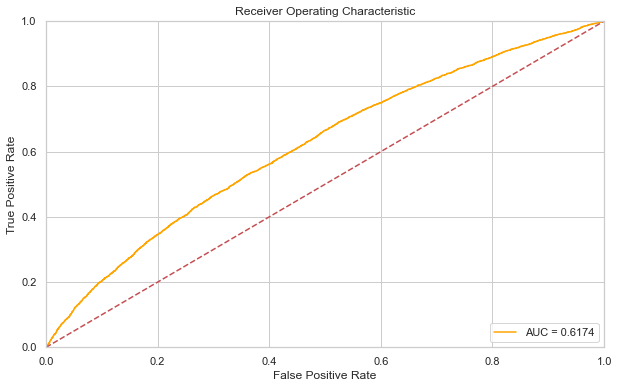

AUC                0.6174
Gini coefficient   0.2349


In [47]:
#Evaluation metrics to be used - ROC curve and AUC
# Gini coefficient
def plot_auc(labels, probs):
    ## Compute the false positive rate, true positive rate
    ## and threshold along with the AUC
    fpr, tpr, threshold = sklm.roc_curve(labels, probs[:,1])
    auc = sklm.auc(fpr, tpr)
    
    ## Plot the result
    plt.title('Receiver Operating Characteristic')
    plt.plot(fpr, tpr, color = 'orange', label = 'AUC = %0.4f' % auc)
    plt.legend(loc = 'lower right')
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0, 1])
    plt.ylim([0, 1])
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()
    
    print('AUC                %6.4f' % auc ) 
    gini = auc*2-1
    print('Gini coefficient   %6.4f' % gini )
    
plot_auc(y_test, probabilities)

### Q4.2 Build Random Forest classifier to compare model accuracy over the logistic regression model


In [48]:
#-------------------------------- Model training -------------------------------#

#type your code to build random forest classifier model on training data set
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_estimators=800, random_state = 0)
rf.fit(X_train, y_train);

In [ ]:
#-------------------------------- Model testing ---------------------------------#

#type your code here to predict for X_test data set using the fitted RF model

probabilities_rf = rf.predict_proba(X_test)

print(probabilities_rf)

#Use a probability threshold to classify customers as churners and non churners (Default = 0.5)
# class probabilities to be transformed into actual class scores
# set the threshold between the two likelihoods at 0.5
def score_model(probs, threshold):
    return np.array([1 if x > threshold else 0 for x in probs[:,1]])
scores_rf = score_model(probabilities_rf, 0.5)
print(np.array(scores_rf))
print(y_test)

#Evaluate model accuracy using fitted y value and actual y_test
#Evaluation metrics to be used - GINI, Precision, Recall, confusion matrix

def print_metrics(labels, scores):
    metrics = sklm.precision_recall_fscore_support(labels, scores,zero_division=0)
    conf = sklm.confusion_matrix(labels, scores)
    #sns.heatmap(conf, annot=True)
    
    print('\n\n                          Confusion matrix')
    print('                 Score positive    Score negative')
    print('Actual positive    %6d' % conf[0,0] + '             %5d' % conf[0,1])
    print('Actual negative    %6d' % conf[1,0] + '             %5d' % conf[1,1])
    print('')
    print('Accuracy  %0.4f' % sklm.accuracy_score(labels, scores))
    print(' ')
    print('           Positive      Negative') 
    print('Num case   %6d' % metrics[3][0] + '        %6d' % metrics[3][1])
    print('Precision  %6.4f' % metrics[0][0] + '        %6.4f' % metrics[0][1])
    print('Recall     %6.4f' % metrics[1][0] + '        %6.4f' % metrics[1][1])
    print('F1         %6.4f' % metrics[2][0] + '        %6.4f' % metrics[2][1])
    
print_metrics(y_test, scores_rf)
print('\nPositive means churn and Negative means did not churn.')

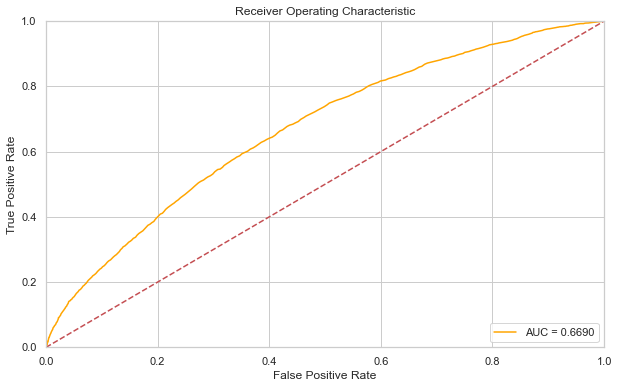

AUC                0.6690
Gini coefficient   0.3380


In [50]:
#Evaluation metrics to be used - ROC curve and AUC
def plot_auc(labels, probs):
    ## Compute the false positive rate, true positive rate
    ## and threshold along with the AUC
    fpr, tpr, threshold = sklm.roc_curve(labels, probs[:,1])
    auc = sklm.auc(fpr, tpr)
    
    ## Plot the result
    plt.title('Receiver Operating Characteristic')
    plt.plot(fpr, tpr, color = 'orange', label = 'AUC = %0.4f' % auc)
    plt.legend(loc = 'lower right')
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0, 1])
    plt.ylim([0, 1])
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()
    
    print('AUC                %6.4f' % auc ) 
    gini = auc*2-1
    print('Gini coefficient   %6.4f' % gini )
    
plot_auc(y_test, probabilities_rf)

<mark>__Result:__
    
Type your answer from the model building exercise here, i.e., which model has better accuracy and using what metrics?

The first column, with a probability of a score of  0,  and the second column, with a probability of a score of  1 shows that for these cases, but not all cases, the probability of a score of  0  is higher than 1. The class with the highest probability is taken as the score (prediction).

We would prefer the Random Forest model over the logistic regression model for the following reasons:     
1. The Random Forest model has better accuracy of 0.7239 than the logistic regression model which has a value of 0.7163.
2. In the Random Forest model, the precision (0.7258) and F1 (0.8366) show a higher value as compared to the logistic regression model (0.7199 and 0.8330) respectively.
3. The Random Forest model also has higher AUC of 0.6690 than the logistic regression model which has a value of 0.6174.
4. The Random Forest model also has higher Gini coefficient of 0.3380 than the logistic regression model which has a value of 0.235.
    



### Q4.3 Identify most important features impacting churn

In [51]:
# Type your code here to plot the top 20 important predictor features impacting churn using the Random Forest model created

important_features = pd.DataFrame(pd.Series(data=rf.feature_importances_,index=X.columns)).rename(columns={0: "Importance"})
important_features.sort_values(by="Importance", ascending=False,inplace=True)
important_features.iloc[:20,:].reset_index()

,index,Importance
0,CurrentEquipmentDays,0.054731
1,PercChangeMinutes,0.045926
2,MonthlyMinutes,0.044722
3,perc_recurrent_charge,0.041898
4,MonthsInService,0.040096
5,MonthlyRevenue,0.039227
6,PercChangeRevenues,0.039096
7,PeakCallsInOut,0.035124
8,OffPeakCallsInOut,0.034891
9,UnansweredCalls,0.033504


In [52]:
important_features.index.tolist()[:20]

['CurrentEquipmentDays',
 'PercChangeMinutes',
 'MonthlyMinutes',
 'perc_recurrent_charge',
 'MonthsInService',
 'MonthlyRevenue',
 'PercChangeRevenues',
 'PeakCallsInOut',
 'OffPeakCallsInOut',
 'UnansweredCalls',
 'ReceivedCalls',
 'OutboundCalls',
 'DroppedBlockedCalls',
 'DroppedCalls',
 'TotalRecurringCharge',
 'AgeHH1',
 'InboundCalls',
 'BlockedCalls',
 'OverageMinutes',
 'perc_overage_minutes']

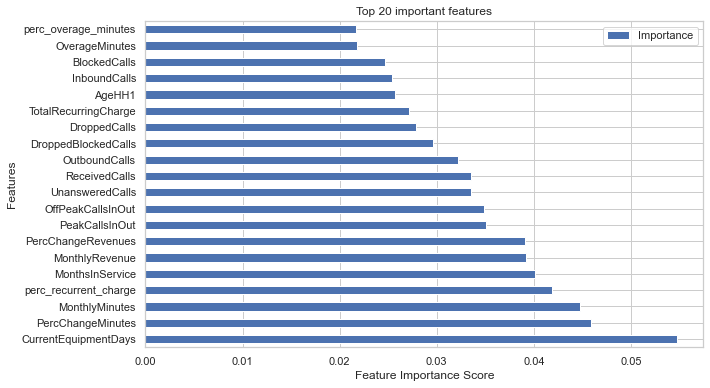

In [53]:
important_features.nlargest(20,"Importance").plot(kind='barh')
plt.title("Top 20 important features")
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.show();

---

## Q5. Use the hold out data provided to predict churners using the best model identified in step 4 

In [54]:
#Type your code here to predict churners based on the hold out data set provided

### Import and prepare hold out data

In [55]:
#import and load hold out data set
customer_df=pd.read_csv("Mini_project_3_Hold_Out_Data.xls")


# Keep customers with MonthlyRevenue>0.0 only
customer_df=customer_df[customer_df.MonthlyRevenue>0.0]


#Note #1: use "create_features(cust_df)" functions to create the additional list of features in the hold out data set
customer_df=create_features(customer_df)

customer_df.head()

,CustomerID,Churn,MonthlyRevenue,MonthlyMinutes,TotalRecurringCharge,DirectorAssistedCalls,OverageMinutes,RoamingCalls,PercChangeMinutes,PercChangeRevenues,DroppedCalls,BlockedCalls,UnansweredCalls,CustomerCareCalls,ThreewayCalls,ReceivedCalls,OutboundCalls,InboundCalls,PeakCallsInOut,OffPeakCallsInOut,DroppedBlockedCalls,CallForwardingCalls,CallWaitingCalls,MonthsInService,UniqueSubs,ActiveSubs,ServiceArea,Handsets,HandsetModels,CurrentEquipmentDays,AgeHH1,AgeHH2,ChildrenInHH,HandsetRefurbished,HandsetWebCapable,TruckOwner,RVOwner,Homeownership,BuysViaMailOrder,RespondsToMailOffers,OptOutMailings,NonUSTravel,OwnsComputer,HasCreditCard,RetentionCalls,RetentionOffersAccepted,NewCellphoneUser,NotNewCellphoneUser,ReferralsMadeBySubscriber,IncomeGroup,OwnsMotorcycle,AdjustmentsToCreditRating,HandsetPrice,MadeCallToRetentionTeam,CreditRating,PrizmCode,Occupation,MaritalStatus,perc_active_subs,perc_recurrent_charge,perc_overage_minutes
0,3000006,NaN,57.49,483.0,37.0,0.25,23.0,0.0,532.0,51.0,8.3,1.0,61.3,1.7,0.3,55.3,46.3,6.3,83.7,157.0,9.3,0.0,5.7,56,1,1,MILMIL414,7,6,240,30.0,0.0,No,No,Yes,Yes,Yes,Unknown,Yes,Yes,No,No,No,Yes,0,0,No,Yes,0,5,No,1,150,No,5-Low,Other,Other,No,0.003295,64.359019,0.000204
1,3000018,NaN,55.23,570.0,72.0,0.00,0.0,0.0,38.0,0.0,9.7,0.7,77.0,8.7,0.0,106.3,14.7,0.7,97.3,90.3,10.3,0.0,0.0,57,1,1,NNYSYR315,6,4,434,56.0,0.0,No,No,Yes,No,No,Known,No,No,No,No,Yes,Yes,0,0,Yes,No,0,6,No,2,80,No,1-Highest,Other,Professional,No,0.003295,130.363933,0.000000
2,3000034,NaN,97.34,1039.0,50.0,4.95,420.0,0.0,198.0,23.3,12.7,3.0,176.0,11.3,0.3,213.9,103.3,0.3,238.3,192.3,15.7,0.0,4.0,55,1,1,MILMIL414,3,3,700,38.0,24.0,No,No,No,No,No,Unknown,No,No,No,No,No,No,0,0,Yes,No,0,4,No,3,10,No,3-Good,Suburban,Crafts,Yes,0.003295,51.366345,0.003721
3,3000070,NaN,35.59,153.0,30.0,0.00,16.0,0.0,30.0,7.3,2.0,0.7,17.3,0.0,0.0,33.1,8.0,4.7,48.3,7.0,2.7,0.0,0.3,59,3,2,SLCSLC801,6,5,48,46.0,0.0,Yes,No,Yes,Yes,Yes,Known,Yes,Yes,Yes,No,No,Yes,0,0,No,Yes,0,4,No,1,200,No,1-Highest,Other,Other,No,0.006590,84.293341,0.000142
4,3000074,NaN,55.27,1213.0,50.0,0.74,0.0,1.3,169.0,1.0,2.7,6.0,43.7,4.3,0.0,490.1,50.7,8.3,189.3,105.0,8.7,0.0,4.3,52,1,1,OKCTUL918,4,4,408,58.0,0.0,No,No,Yes,No,No,Known,Yes,Yes,No,No,No,Yes,0,0,No,Yes,0,3,No,0,10,No,1-Highest,Suburban,Other,No,0.003295,90.464990,0.000000


In [56]:
customer_df.shape

(19938, 61)

In [57]:
pd.set_option("max_rows",None)
print((customer_df.astype(np.object) == 'Unknown').any())

CustomerID                   False
Churn                        False
MonthlyRevenue               False
MonthlyMinutes               False
TotalRecurringCharge         False
DirectorAssistedCalls        False
OverageMinutes               False
RoamingCalls                 False
PercChangeMinutes            False
PercChangeRevenues           False
DroppedCalls                 False
BlockedCalls                 False
UnansweredCalls              False
CustomerCareCalls            False
ThreewayCalls                False
ReceivedCalls                False
OutboundCalls                False
InboundCalls                 False
PeakCallsInOut               False
OffPeakCallsInOut            False
DroppedBlockedCalls          False
CallForwardingCalls          False
CallWaitingCalls             False
MonthsInService              False
UniqueSubs                   False
ActiveSubs                   False
ServiceArea                  False
Handsets                     False
HandsetModels       

In [58]:
# Replace all 'Unknown' values with nan
cols = ["Homeownership", "HandsetPrice", 'MaritalStatus']
for column in cols:
    customer_df.loc[customer_df[column] == 'Unknown', column] = np.nan

In [59]:
customer_df.isnull().sum()

CustomerID                       0
Churn                        19938
MonthlyRevenue                   0
MonthlyMinutes                   0
TotalRecurringCharge             0
DirectorAssistedCalls            0
OverageMinutes                   0
RoamingCalls                     0
PercChangeMinutes               74
PercChangeRevenues              74
DroppedCalls                     0
BlockedCalls                     0
UnansweredCalls                  0
CustomerCareCalls                0
ThreewayCalls                    0
ReceivedCalls                    0
OutboundCalls                    0
InboundCalls                     0
PeakCallsInOut                   0
OffPeakCallsInOut                0
DroppedBlockedCalls              0
CallForwardingCalls              0
CallWaitingCalls                 0
MonthsInService                  0
UniqueSubs                       0
ActiveSubs                       0
ServiceArea                      4
Handsets                         0
HandsetModels       

In [60]:
customer_df.drop(["HandsetPrice", "MaritalStatus", "Homeownership","Churn"], axis = 1,inplace=True)
customer_df.dropna(inplace=True)

In [61]:
customer_df.shape

(19528, 57)

In [62]:
customer_df.describe()

,CustomerID,MonthlyRevenue,MonthlyMinutes,TotalRecurringCharge,DirectorAssistedCalls,OverageMinutes,RoamingCalls,PercChangeMinutes,PercChangeRevenues,DroppedCalls,BlockedCalls,UnansweredCalls,CustomerCareCalls,ThreewayCalls,ReceivedCalls,OutboundCalls,InboundCalls,PeakCallsInOut,OffPeakCallsInOut,DroppedBlockedCalls,CallForwardingCalls,CallWaitingCalls,MonthsInService,UniqueSubs,ActiveSubs,Handsets,HandsetModels,CurrentEquipmentDays,AgeHH1,AgeHH2,RetentionCalls,RetentionOffersAccepted,ReferralsMadeBySubscriber,IncomeGroup,AdjustmentsToCreditRating,perc_active_subs,perc_recurrent_charge,perc_overage_minutes
count,1.952800e+04,19528.00000,19528.000000,19528.000000,19528.000000,19528.000000,19528.000000,19528.000000,19528.000000,19528.000000,19528.000000,19528.000000,19528.000000,19528.000000,19528.000000,19528.000000,19528.000000,19528.000000,19528.000000,19528.000000,19528.000000,19528.000000,19528.000000,19528.000000,19528.000000,19528.000000,19528.000000,19528.000000,19528.000000,19528.000000,19528.000000,19528.000000,19528.000000,19528.000000,19528.000000,19528.000000,19528.000000,19528.000000
mean,3.200962e+06,58.78154,525.120852,46.945617,0.889253,39.978800,1.178549,-9.206217,-1.234156,6.012387,4.026787,28.607471,1.855863,0.295678,115.244649,25.482809,8.170361,90.757937,68.401746,10.124780,0.010190,1.882405,18.718609,1.520842,1.342687,1.817186,1.569592,379.041428,31.491704,21.192390,0.034924,0.017206,0.047624,4.431637,0.051055,0.004424,90.386949,0.000354
std,1.161071e+05,43.39156,529.186725,24.031847,2.094771,95.265089,6.707757,248.843970,36.597236,8.907091,9.967107,39.011616,5.343267,1.150817,165.475496,34.992965,16.144040,104.546520,94.875056,14.861095,0.472777,5.505437,9.703165,0.849254,0.613547,1.351012,0.914522,253.797665,22.045395,23.882739,0.199885,0.139540,0.240741,3.107543,0.354799,0.002022,28.696807,0.000844
min,3.000006e+06,0.15000,0.000000,0.000000,0.000000,0.000000,0.000000,-2518.000000,-459.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,1.000000,0.000000,1.000000,1.000000,-5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.100268e+06,33.71750,159.000000,30.000000,0.000000,0.000000,0.000000,-82.000000,-7.100000,0.700000,0.000000,5.300000,0.000000,0.000000,9.000000,3.300000,0.000000,23.300000,11.300000,2.000000,0.000000,0.000000,11.000000,1.000000,1.000000,1.000000,1.000000,202.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.003295,72.921731,0.000000
50%,3.200010e+06,48.55000,365.000000,45.000000,0.250000,2.000000,0.000000,-4.000000,-0.300000,3.000000,1.000000,16.300000,0.000000,0.000000,52.100000,13.700000,2.000000,61.700000,35.700000,5.700000,0.000000,0.300000,16.000000,1.000000,1.000000,1.000000,1.000000,331.000000,36.000000,0.000000,0.000000,0.000000,0.000000,5.000000,0.000000,0.003295,95.328885,0.000018
75%,3.302963e+06,70.65250,716.000000,60.000000,0.990000,40.000000,0.300000,66.000000,1.500000,7.700000,3.700000,37.000000,1.700000,0.300000,155.825000,33.700000,9.075000,121.000000,89.300000,12.700000,0.000000,1.700000,24.000000,2.000000,2.000000,2.000000,2.000000,513.000000,48.000000,44.000000,0.000000,0.000000,0.000000,7.000000,0.000000,0.006590,109.838381,0.000354
max,3.399938e+06,635.06000,7668.000000,350.000000,67.810000,3472.000000,488.800000,3222.000000,895.600000,195.300000,313.000000,676.700000,365.700000,55.700000,3287.200000,610.300000,282.700000,1311.700000,1572.700000,327.300000,54.700000,195.000000,61.000000,11.000000,7.000000,28.000000,16.000000,1823.000000,98.000000,99.000000,4.000000,4.000000,5.000000,9.000000,14.000000,0.023066,368.324125,0.030757


In [63]:
customer_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19528 entries, 0 to 19995
Data columns (total 57 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   CustomerID                 19528 non-null  int64  
 1   MonthlyRevenue             19528 non-null  float64
 2   MonthlyMinutes             19528 non-null  float64
 3   TotalRecurringCharge       19528 non-null  float64
 4   DirectorAssistedCalls      19528 non-null  float64
 5   OverageMinutes             19528 non-null  float64
 6   RoamingCalls               19528 non-null  float64
 7   PercChangeMinutes          19528 non-null  float64
 8   PercChangeRevenues         19528 non-null  float64
 9   DroppedCalls               19528 non-null  float64
 10  BlockedCalls               19528 non-null  float64
 11  UnansweredCalls            19528 non-null  float64
 12  CustomerCareCalls          19528 non-null  float64
 13  ThreewayCalls              19528 non-null  flo

### Predict using Random Forest Classifier model selected

In [64]:
#Note #2: Also, perform feature scaling and dummy variables creation as performed during the initial stages of step #4

#Create dummy variables for 18 categorical variables (hold out data set)
# Excluded ServiceArea as that column was excluded from the predictive models
customer_dummy_df = pd.get_dummies(customer_df[['ChildrenInHH', 'HandsetRefurbished',
       'HandsetWebCapable', 'TruckOwner', 'RVOwner', 'BuysViaMailOrder',
       'RespondsToMailOffers', 'OptOutMailings', 'NonUSTravel', 'OwnsComputer',
       'HasCreditCard', 'NewCellphoneUser', 'NotNewCellphoneUser',
       'OwnsMotorcycle', 'MadeCallToRetentionTeam', 'CreditRating',
       'PrizmCode', 'Occupation']])
print(customer_dummy_df.shape)

# DataFrame with numerical variables only (hold out data set)
customer_df_num=customer_df.drop(['ServiceArea', 'ChildrenInHH', 'HandsetRefurbished',
       'HandsetWebCapable', 'TruckOwner', 'RVOwner', 'BuysViaMailOrder',
       'RespondsToMailOffers', 'OptOutMailings', 'NonUSTravel', 'OwnsComputer',
       'HasCreditCard', 'NewCellphoneUser', 'NotNewCellphoneUser',
       'OwnsMotorcycle', 'MadeCallToRetentionTeam', 'CreditRating',
       'PrizmCode', 'Occupation'], axis = 1) 
print(customer_df_num.shape)

# Concatenate numeric variables with dummy variables into a single dataframe (hold out data set)
customer_df = pd.concat([customer_df_num, customer_dummy_df],axis=1)
print(customer_df.shape)
display(customer_df.head())

(19528, 49)
(19528, 38)
(19528, 87)


,CustomerID,MonthlyRevenue,MonthlyMinutes,TotalRecurringCharge,DirectorAssistedCalls,OverageMinutes,RoamingCalls,PercChangeMinutes,PercChangeRevenues,DroppedCalls,BlockedCalls,UnansweredCalls,CustomerCareCalls,ThreewayCalls,ReceivedCalls,OutboundCalls,InboundCalls,PeakCallsInOut,OffPeakCallsInOut,DroppedBlockedCalls,CallForwardingCalls,CallWaitingCalls,MonthsInService,UniqueSubs,ActiveSubs,Handsets,HandsetModels,CurrentEquipmentDays,AgeHH1,AgeHH2,RetentionCalls,RetentionOffersAccepted,ReferralsMadeBySubscriber,IncomeGroup,AdjustmentsToCreditRating,perc_active_subs,perc_recurrent_charge,perc_overage_minutes,ChildrenInHH_No,ChildrenInHH_Yes,HandsetRefurbished_No,HandsetRefurbished_Yes,HandsetWebCapable_No,HandsetWebCapable_Yes,TruckOwner_No,TruckOwner_Yes,RVOwner_No,RVOwner_Yes,BuysViaMailOrder_No,BuysViaMailOrder_Yes,RespondsToMailOffers_No,RespondsToMailOffers_Yes,OptOutMailings_No,OptOutMailings_Yes,NonUSTravel_No,NonUSTravel_Yes,OwnsComputer_No,OwnsComputer_Yes,HasCreditCard_No,HasCreditCard_Yes,NewCellphoneUser_No,NewCellphoneUser_Yes,NotNewCellphoneUser_No,NotNewCellphoneUser_Yes,OwnsMotorcycle_No,OwnsMotorcycle_Yes,MadeCallToRetentionTeam_No,MadeCallToRetentionTeam_Yes,CreditRating_1-Highest,CreditRating_2-High,CreditRating_3-Good,CreditRating_4-Medium,CreditRating_5-Low,CreditRating_6-VeryLow,CreditRating_7-Lowest,PrizmCode_Other,PrizmCode_Rural,PrizmCode_Suburban,PrizmCode_Town,Occupation_Clerical,Occupation_Crafts,Occupation_Homemaker,Occupation_Other,Occupation_Professional,Occupation_Retired,Occupation_Self,Occupation_Student
0,3000006,57.49,483.0,37.0,0.25,23.0,0.0,532.0,51.0,8.3,1.0,61.3,1.7,0.3,55.3,46.3,6.3,83.7,157.0,9.3,0.0,5.7,56,1,1,7,6,240,30.0,0.0,0,0,0,5,1,0.003295,64.359019,0.000204,1,0,1,0,0,1,0,1,0,1,0,1,0,1,1,0,1,0,1,0,0,1,1,0,0,1,1,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0
1,3000018,55.23,570.0,72.0,0.00,0.0,0.0,38.0,0.0,9.7,0.7,77.0,8.7,0.0,106.3,14.7,0.7,97.3,90.3,10.3,0.0,0.0,57,1,1,6,4,434,56.0,0.0,0,0,0,6,2,0.003295,130.363933,0.000000,1,0,1,0,0,1,1,0,1,0,1,0,1,0,1,0,1,0,0,1,0,1,0,1,1,0,1,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0
2,3000034,97.34,1039.0,50.0,4.95,420.0,0.0,198.0,23.3,12.7,3.0,176.0,11.3,0.3,213.9,103.3,0.3,238.3,192.3,15.7,0.0,4.0,55,1,1,3,3,700,38.0,24.0,0,0,0,4,3,0.003295,51.366345,0.003721,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,0,1,1,0,1,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0
3,3000070,35.59,153.0,30.0,0.00,16.0,0.0,30.0,7.3,2.0,0.7,17.3,0.0,0.0,33.1,8.0,4.7,48.3,7.0,2.7,0.0,0.3,59,3,2,6,5,48,46.0,0.0,0,0,0,4,1,0.006590,84.293341,0.000142,0,1,1,0,0,1,0,1,0,1,0,1,0,1,0,1,1,0,1,0,0,1,1,0,0,1,1,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0
4,3000074,55.27,1213.0,50.0,0.74,0.0,1.3,169.0,1.0,2.7,6.0,43.7,4.3,0.0,490.1,50.7,8.3,189.3,105.0,8.7,0.0,4.3,52,1,1,4,4,408,58.0,0.0,0,0,0,3,0,0.003295,90.464990,0.000000,1,0,1,0,0,1,1,0,1,0,0,1,0,1,1,0,1,0,1,0,0,1,1,0,0,1,1,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0


With the dummy variables the original 18 categorical features are now 49 dummy variables. With the 37 numeric features and the 1 numeric identifier column (CustomerID), there are a total of 87 variables.

In [65]:
#Define columns to be included in X_customer (hold out data set)
# X_customer = Independent variables (hold out data set)

# features
# all rows, columns from column at index 1 onwards
X_customer = customer_df.iloc[:,1:]  

display(X_customer.head())

,MonthlyRevenue,MonthlyMinutes,TotalRecurringCharge,DirectorAssistedCalls,OverageMinutes,RoamingCalls,PercChangeMinutes,PercChangeRevenues,DroppedCalls,BlockedCalls,UnansweredCalls,CustomerCareCalls,ThreewayCalls,ReceivedCalls,OutboundCalls,InboundCalls,PeakCallsInOut,OffPeakCallsInOut,DroppedBlockedCalls,CallForwardingCalls,CallWaitingCalls,MonthsInService,UniqueSubs,ActiveSubs,Handsets,HandsetModels,CurrentEquipmentDays,AgeHH1,AgeHH2,RetentionCalls,RetentionOffersAccepted,ReferralsMadeBySubscriber,IncomeGroup,AdjustmentsToCreditRating,perc_active_subs,perc_recurrent_charge,perc_overage_minutes,ChildrenInHH_No,ChildrenInHH_Yes,HandsetRefurbished_No,HandsetRefurbished_Yes,HandsetWebCapable_No,HandsetWebCapable_Yes,TruckOwner_No,TruckOwner_Yes,RVOwner_No,RVOwner_Yes,BuysViaMailOrder_No,BuysViaMailOrder_Yes,RespondsToMailOffers_No,RespondsToMailOffers_Yes,OptOutMailings_No,OptOutMailings_Yes,NonUSTravel_No,NonUSTravel_Yes,OwnsComputer_No,OwnsComputer_Yes,HasCreditCard_No,HasCreditCard_Yes,NewCellphoneUser_No,NewCellphoneUser_Yes,NotNewCellphoneUser_No,NotNewCellphoneUser_Yes,OwnsMotorcycle_No,OwnsMotorcycle_Yes,MadeCallToRetentionTeam_No,MadeCallToRetentionTeam_Yes,CreditRating_1-Highest,CreditRating_2-High,CreditRating_3-Good,CreditRating_4-Medium,CreditRating_5-Low,CreditRating_6-VeryLow,CreditRating_7-Lowest,PrizmCode_Other,PrizmCode_Rural,PrizmCode_Suburban,PrizmCode_Town,Occupation_Clerical,Occupation_Crafts,Occupation_Homemaker,Occupation_Other,Occupation_Professional,Occupation_Retired,Occupation_Self,Occupation_Student
0,57.49,483.0,37.0,0.25,23.0,0.0,532.0,51.0,8.3,1.0,61.3,1.7,0.3,55.3,46.3,6.3,83.7,157.0,9.3,0.0,5.7,56,1,1,7,6,240,30.0,0.0,0,0,0,5,1,0.003295,64.359019,0.000204,1,0,1,0,0,1,0,1,0,1,0,1,0,1,1,0,1,0,1,0,0,1,1,0,0,1,1,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0
1,55.23,570.0,72.0,0.00,0.0,0.0,38.0,0.0,9.7,0.7,77.0,8.7,0.0,106.3,14.7,0.7,97.3,90.3,10.3,0.0,0.0,57,1,1,6,4,434,56.0,0.0,0,0,0,6,2,0.003295,130.363933,0.000000,1,0,1,0,0,1,1,0,1,0,1,0,1,0,1,0,1,0,0,1,0,1,0,1,1,0,1,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0
2,97.34,1039.0,50.0,4.95,420.0,0.0,198.0,23.3,12.7,3.0,176.0,11.3,0.3,213.9,103.3,0.3,238.3,192.3,15.7,0.0,4.0,55,1,1,3,3,700,38.0,24.0,0,0,0,4,3,0.003295,51.366345,0.003721,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,0,1,1,0,1,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0
3,35.59,153.0,30.0,0.00,16.0,0.0,30.0,7.3,2.0,0.7,17.3,0.0,0.0,33.1,8.0,4.7,48.3,7.0,2.7,0.0,0.3,59,3,2,6,5,48,46.0,0.0,0,0,0,4,1,0.006590,84.293341,0.000142,0,1,1,0,0,1,0,1,0,1,0,1,0,1,0,1,1,0,1,0,0,1,1,0,0,1,1,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0
4,55.27,1213.0,50.0,0.74,0.0,1.3,169.0,1.0,2.7,6.0,43.7,4.3,0.0,490.1,50.7,8.3,189.3,105.0,8.7,0.0,4.3,52,1,1,4,4,408,58.0,0.0,0,0,0,3,0,0.003295,90.464990,0.000000,1,0,1,0,0,1,1,0,1,0,0,1,0,1,1,0,1,0,1,0,0,1,1,0,0,1,1,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0


In [66]:
X_customer_test = X_customer.to_numpy()

# test set
print(X_customer_test.shape)

(19528, 86)


In [67]:
X_customer_test[:,:37] = sc.transform(X_customer_test[:,:37])

The 37 numeric features are now scaled.

---

In [68]:
#type your code here to predict for X_customer_test (hold out) data set using the fitted RF model

# Probability of not churning and probability of churning (hold out data)
probabilities_customer_rf = rf.predict_proba(X_customer_test)

probabilities_customer_rf = pd.DataFrame(probabilities_customer_rf)
probabilities_customer_rf = probabilities_customer_rf.rename(columns={0: "No_Churn_Probability", 1:"Churn_Probability"})

In [69]:
#Use "predict" function on the transformed data using the best fitted model object (hold out data)

y_pred = rf.predict(np.array(X_customer_test))

prediction=pd.DataFrame(y_pred)

prediction[0].replace({1:"Yes", 0:"No"},inplace=True)
prediction=prediction.rename(columns={0: "PredictedChurn"})
prediction

,PredictedChurn
0,No
1,No
2,No
3,No
4,No
5,No
6,No
7,No
8,No
9,No


In [70]:
# updated customer dataframe with churn predictions and churn probabilities in the last 3 columns (hold out data)

predicted_churn_df = pd.concat([customer_df.reset_index(drop=True), prediction.reset_index(drop=True),probabilities_customer_rf.reset_index(drop=True)],axis=1)
predicted_churn_df.head()
predicted_churn_df.shape

,CustomerID,MonthlyRevenue,MonthlyMinutes,TotalRecurringCharge,DirectorAssistedCalls,OverageMinutes,RoamingCalls,PercChangeMinutes,PercChangeRevenues,DroppedCalls,BlockedCalls,UnansweredCalls,CustomerCareCalls,ThreewayCalls,ReceivedCalls,OutboundCalls,InboundCalls,PeakCallsInOut,OffPeakCallsInOut,DroppedBlockedCalls,CallForwardingCalls,CallWaitingCalls,MonthsInService,UniqueSubs,ActiveSubs,Handsets,HandsetModels,CurrentEquipmentDays,AgeHH1,AgeHH2,RetentionCalls,RetentionOffersAccepted,ReferralsMadeBySubscriber,IncomeGroup,AdjustmentsToCreditRating,perc_active_subs,perc_recurrent_charge,perc_overage_minutes,ChildrenInHH_No,ChildrenInHH_Yes,HandsetRefurbished_No,HandsetRefurbished_Yes,HandsetWebCapable_No,HandsetWebCapable_Yes,TruckOwner_No,TruckOwner_Yes,RVOwner_No,RVOwner_Yes,BuysViaMailOrder_No,BuysViaMailOrder_Yes,RespondsToMailOffers_No,RespondsToMailOffers_Yes,OptOutMailings_No,OptOutMailings_Yes,NonUSTravel_No,NonUSTravel_Yes,OwnsComputer_No,OwnsComputer_Yes,HasCreditCard_No,HasCreditCard_Yes,NewCellphoneUser_No,NewCellphoneUser_Yes,NotNewCellphoneUser_No,NotNewCellphoneUser_Yes,OwnsMotorcycle_No,OwnsMotorcycle_Yes,MadeCallToRetentionTeam_No,MadeCallToRetentionTeam_Yes,CreditRating_1-Highest,CreditRating_2-High,CreditRating_3-Good,CreditRating_4-Medium,CreditRating_5-Low,CreditRating_6-VeryLow,CreditRating_7-Lowest,PrizmCode_Other,PrizmCode_Rural,PrizmCode_Suburban,PrizmCode_Town,Occupation_Clerical,Occupation_Crafts,Occupation_Homemaker,Occupation_Other,Occupation_Professional,Occupation_Retired,Occupation_Self,Occupation_Student,PredictedChurn,No_Churn_Probability,Churn_Probability
0,3000006,57.49,483.0,37.0,0.25,23.0,0.0,532.0,51.0,8.3,1.0,61.3,1.7,0.3,55.3,46.3,6.3,83.7,157.0,9.3,0.0,5.7,56,1,1,7,6,240,30.0,0.0,0,0,0,5,1,0.003295,64.359019,0.000204,1,0,1,0,0,1,0,1,0,1,0,1,0,1,1,0,1,0,1,0,0,1,1,0,0,1,1,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,No,0.68625,0.31375
1,3000018,55.23,570.0,72.0,0.00,0.0,0.0,38.0,0.0,9.7,0.7,77.0,8.7,0.0,106.3,14.7,0.7,97.3,90.3,10.3,0.0,0.0,57,1,1,6,4,434,56.0,0.0,0,0,0,6,2,0.003295,130.363933,0.000000,1,0,1,0,0,1,1,0,1,0,1,0,1,0,1,0,1,0,0,1,0,1,0,1,1,0,1,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,No,0.68750,0.31250
2,3000034,97.34,1039.0,50.0,4.95,420.0,0.0,198.0,23.3,12.7,3.0,176.0,11.3,0.3,213.9,103.3,0.3,238.3,192.3,15.7,0.0,4.0,55,1,1,3,3,700,38.0,24.0,0,0,0,4,3,0.003295,51.366345,0.003721,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,0,1,1,0,1,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,No,0.63000,0.37000
3,3000070,35.59,153.0,30.0,0.00,16.0,0.0,30.0,7.3,2.0,0.7,17.3,0.0,0.0,33.1,8.0,4.7,48.3,7.0,2.7,0.0,0.3,59,3,2,6,5,48,46.0,0.0,0,0,0,4,1,0.006590,84.293341,0.000142,0,1,1,0,0,1,0,1,0,1,0,1,0,1,0,1,1,0,1,0,0,1,1,0,0,1,1,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,No,0.71375,0.28625
4,3000074,55.27,1213.0,50.0,0.74,0.0,1.3,169.0,1.0,2.7,6.0,43.7,4.3,0.0,490.1,50.7,8.3,189.3,105.0,8.7,0.0,4.3,52,1,1,4,4,408,58.0,0.0,0,0,0,3,0,0.003295,90.464990,0.000000,1,0,1,0,0,1,1,0,1,0,0,1,0,1,1,0,1,0,1,0,0,1,1,0,0,1,1,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,No,0.79375,0.20625


(19528, 90)

In [71]:
# Predicted count of churners and non churners (hold out data)

# predicted_churn_df = predicted_churn_df[['CustomerID','PredictedChurn']]

predicted_churn_count = predicted_churn_df[['CustomerID','PredictedChurn']].groupby(['PredictedChurn']).agg('count').rename(columns={'CustomerID':'CustomerCount'})
predicted_churn_count

,CustomerCount
PredictedChurn,
No,18981
Yes,547


In [72]:
# dataframe of all predicted churns for all customers (hold out data)
predicted_churn_for_all = predicted_churn_df[['CustomerID','PredictedChurn','Churn_Probability']]

predicted_churn_for_all

,CustomerID,PredictedChurn,Churn_Probability
0,3000006,No,0.31375
1,3000018,No,0.31250
2,3000034,No,0.37000
3,3000070,No,0.28625
4,3000074,No,0.20625
5,3000086,No,0.38875
6,3000098,No,0.31000
7,3000110,No,0.32250
8,3000246,No,0.44750
9,3000254,No,0.26375


In [73]:
# dataframe of all predicted churners (hold out data)

predicted_churners = predicted_churn_df[predicted_churn_df['PredictedChurn']=='Yes'][['CustomerID','PredictedChurn','Churn_Probability']]

predicted_churners

,CustomerID,PredictedChurn,Churn_Probability
164,3003618,Yes,0.77000
196,3004102,Yes,0.62750
261,3005138,Yes,0.53000
281,3005526,Yes,0.55500
302,3006062,Yes,0.54750
316,3006302,Yes,0.55125
326,3006502,Yes,0.80375
370,3007330,Yes,0.51750
415,3008374,Yes,0.61375
447,3009054,Yes,0.70375


## Q6. [Bonus Question] Calculate lift chart and total monthly revenue saved by targeting top 10-20% of the customers using your best predictive model

In [74]:
#Type your code here to plot the lift chart from the best model
#Identify the lift i.e. 3x of capturing churn with and without using the model 
#(Assume: only top 20% high risk customers are to be targetted)

<Figure size 864x864 with 0 Axes>

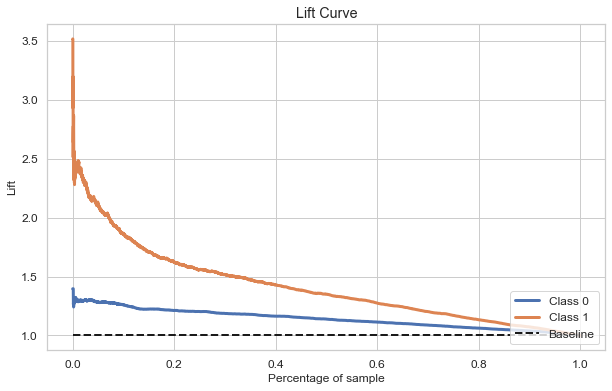

In [75]:
# Referred to http://www.saedsayad.com/model_evaluation_c.htm
# Referred to https://towardsdatascience.com/evaluate-model-performance-with-cumulative-gains-and-lift-curves-1f3f8f79da01

import scikitplot as skplt

plt.figure(figsize=(12,12))
skplt.metrics.plot_lift_curve(y_test, probabilities_rf)
plt.show();

The value on the y-axis for the lift curve for Class 1 at 20% appears to be roughly 1.6, which is 1.6x better than no model at all (baseline is 1.0).

Using the 20% high risk customers of our best predictions, our model is about 1.6x better at predicting churn than randomly selecting 20% from the customer pool.

Lift is 1.6x of capturing churn with versus without using the model (Assuming only top 20% high risk customers are to be targeted). 

---

In [76]:
# Referred to https://www3.nd.edu/~busiforc/handouts/DataMining/Lift%20Charts.html

probabilities_rf=pd.DataFrame(probabilities_rf).rename(columns={0: "No_Churn_Probability", 1:"Churn_Probability"})
y_test=pd.DataFrame(y_test).rename(columns={0: "Actual_Churn_Class"})

cust_churn_df = pd.concat([probabilities_rf[['Churn_Probability']], X_test_revenues, y_test],axis=1)

cust_churn_df.sort_values(by=['Churn_Probability'],inplace=True,ascending=False,kind="mergesort")

cust_churn_df['Cumulative_Actual_Class'] = cust_churn_df['Actual_Churn_Class'].cumsum()
cust_churn_df

,Churn_Probability,MonthlyRevenues,Actual_Churn_Class,Cumulative_Actual_Class
12203,0.91000,10.00,1,1
6170,0.90250,10.00,1,2
4449,0.89625,10.00,1,3
13961,0.85750,50.00,1,4
12158,0.80250,16.99,1,5
12569,0.79500,10.00,0,5
9123,0.79125,10.00,1,6
2816,0.78125,29.99,1,7
7251,0.75625,24.58,1,8
11621,0.75375,39.99,1,9


The top 2 deciles is the top 20% of customers with the highest propensity to churn.

In [77]:
#find number of rows
cust_churn_df.shape

(14924, 4)

In [78]:
#number of rows that consist top 20% (since dataframe is sorted already)

print(14924*.20)

2984.8


In [79]:
# dataframe of top 2 decile customers
cust_churn_df_top2decile = cust_churn_df[:2985]
cust_churn_df_top2decile

,Churn_Probability,MonthlyRevenues,Actual_Churn_Class,Cumulative_Actual_Class
12203,0.91000,10.00,1,1
6170,0.90250,10.00,1,2
4449,0.89625,10.00,1,3
13961,0.85750,50.00,1,4
12158,0.80250,16.99,1,5
12569,0.79500,10.00,0,5
9123,0.79125,10.00,1,6
2816,0.78125,29.99,1,7
7251,0.75625,24.58,1,8
11621,0.75375,39.99,1,9


In [80]:
actual_churn_percentage = (cust_churn_df_top2decile['Cumulative_Actual_Class'].iloc[-1])*100/(cust_churn_df['Cumulative_Actual_Class'].iloc[-1])
print(f"Actual churn percentage captured by targeting top 20% of customers sorted by their churn probability is {actual_churn_percentage:.2f} %.")

Actual churn percentage captured by targeting top 20% of customers sorted by their churn probability is 32.50 %.


In [81]:
total_revenue_top2decile = cust_churn_df_top2decile[cust_churn_df_top2decile['Actual_Churn_Class']==1]['MonthlyRevenues'].sum()
print(f"Total monthly revenue of actual churn customers identified in the top 20% of the customers is ${total_revenue_top2decile:.2f}.")

Total monthly revenue of actual churn customers identified in the top 20% of the customers is $75403.51.


-<mark>__Result:__
    
1. What is the % actual churn captured by targeting top 20% (top 2 deciles) of the customers sorted by their churn probability?
    
**Actual churn percentage captured by targeting top 20% of customers sorted by their churn probability is 32.50%.**  

    
2. What is the total monthly revenue of actual churn customers identified in the top 20% of the customers?

**Total monthly revenue of actual churn customers identified in the top 20% of the customers is $75403.51.**  